<h1><center>Feature Extraction</center></h1>

### Importing Packages
1) preliminary packages are imported <br/>
2) IPython.display library is used for displaying the audio <br/>
3) librosa library is used for music and audio analysis

In [1]:
import os 
import IPython.display as ipd
import librosa
import librosa.display
import matplotlib.pyplot as plt
import csv
import pandas as pd
import numpy as np
from PIL import Image
import pathlib
%matplotlib inline
import time

# Preprocessing
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
import split_folders

#Keras
import keras

import warnings
warnings.filterwarnings('ignore')

D:\Software\Software\Python\lib\site-packages\librosa\util\decorators.py:9: NumbaDeprecationWarning: An import was requested from a module that has moved location.
Import requested from: 'numba.decorators', please update to use 'numba.core.decorators' or pin to Numba version 0.48.0. This alias will not be present in Numba version 0.50.0.
  from numba.decorators import jit as optional_jit
D:\Software\Software\Python\lib\site-packages\librosa\util\decorators.py:9: NumbaDeprecationWarning: An import was requested from a module that has moved location.
Import of 'jit' requested from: 'numba.decorators', please update to use 'numba.core.decorators' or pin to Numba version 0.48.0. This alias will not be present in Numba version 0.50.0.
  from numba.decorators import jit as optional_jit
Using TensorFlow backend.


### Converting Mp3 to Wav and storing in one file "fma_small_wav"

In [ ]:
from pydub import AudioSegment
import os
import shutil

main =os.listdir('fma_small/')
main.append(155)

for each in main:
    print(each)
    lis = os.listdir('fma_small/{}'.format(each))     
    for i in lis:
        a= i[:-4]
        final = a+'.wav'
        song = AudioSegment.from_mp3("fma_small/{}/{}".format(each,i))
        a = song.export('fma_small_wav/{}'.format(final), format="wav")

### Plotting and Playing each type of Genre

                                            Electronic                                              


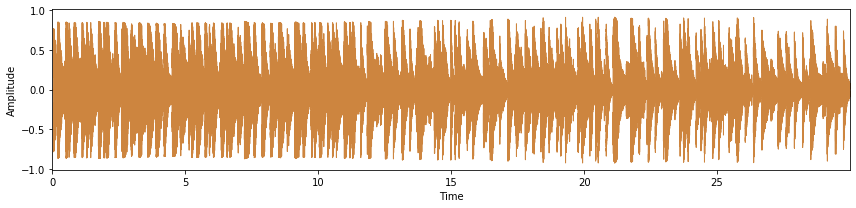

                                           Experimental                                             


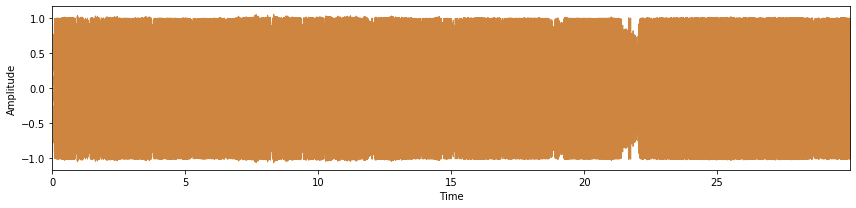

                                               Folk                                                 


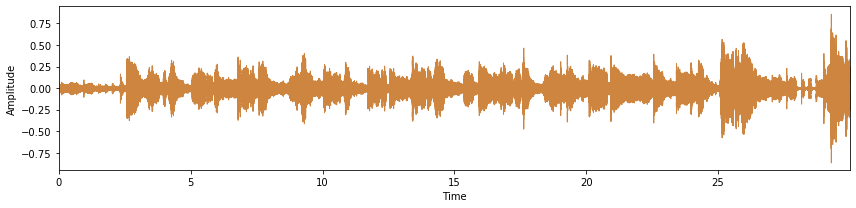

                                              Hip-Hop                                               


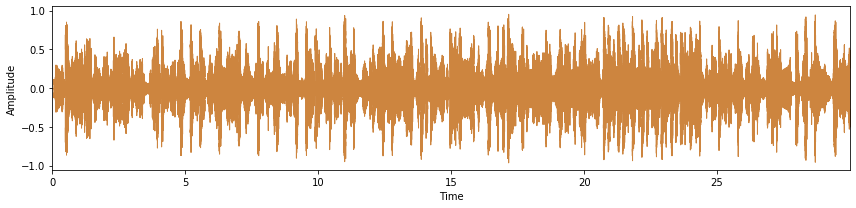

                                           Instrumental                                             


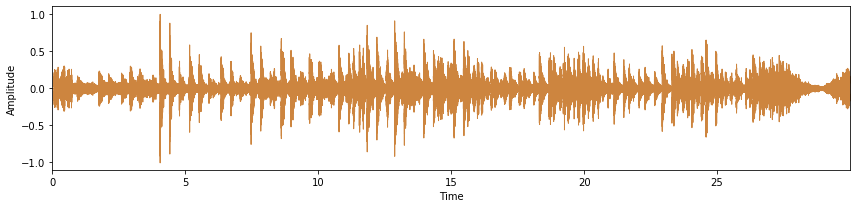

                                           International                                            


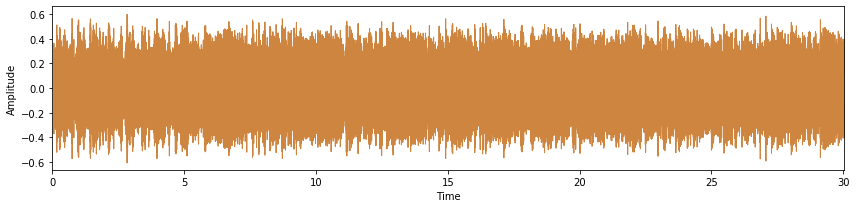

                                                Pop                                                 


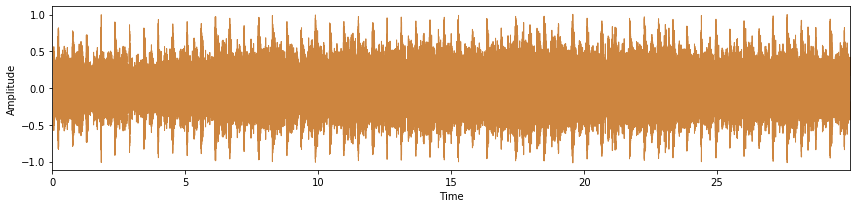

                                               Rock                                                 


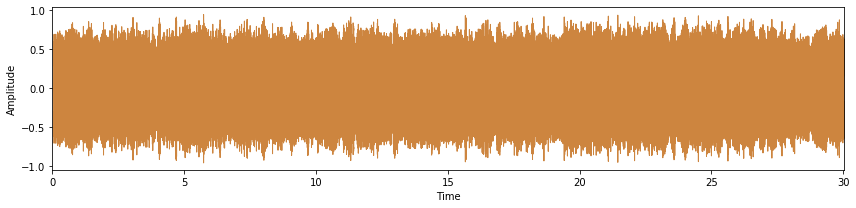

In [5]:
cmap = plt.get_cmap('copper')
source1 = 'new/'
for filename in os.listdir(f'{source1}'):
    audioname = f'{source1}/{filename}'
    audiotime, sr5 = librosa.load(audioname)
    filename = filename[:-3].replace("."," ")
    new_string = filename.center(100)
    print('\033[1m' + new_string)
    
## Playing Audio File 
    
    ipd.display(ipd.Audio(data=audiotime, rate=sr5))
    
 ## Audio Freq Visualialization
    
    plt.figure(figsize=(12, 3))
    
    librosa.display.waveplot(audiotime, sr=sr5, color='peru')
    
    plt.ylabel('Amplitude')
    plt.tight_layout()
    plt.show()

### Plotting spectogram 
As audio frequency does not gives features so, audio is converted into spectogram to pull the information for Deep learning

                                Electronic Genre                                


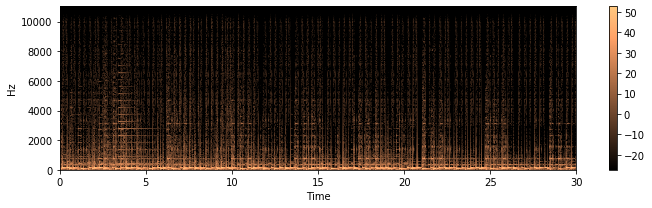

                               Experimental Genre                               


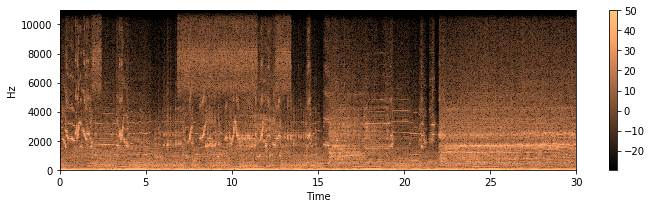

                                   Folk Genre                                   


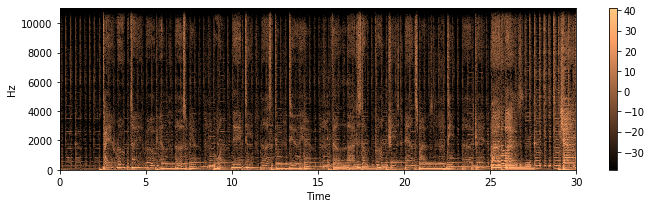

                                 Hip-Hop Genre                                  


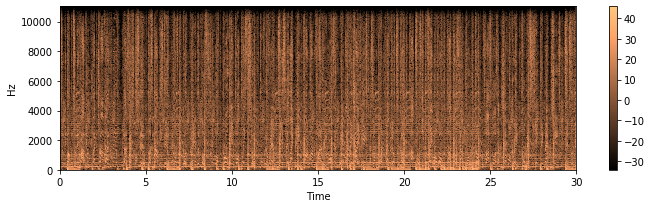

                               Instrumental Genre                               


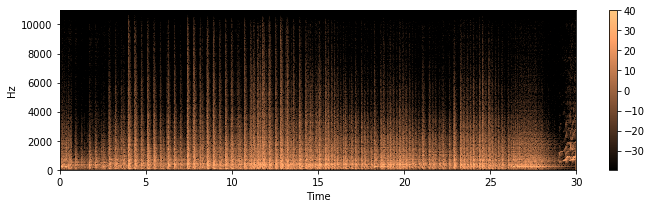

                              International Genre                               


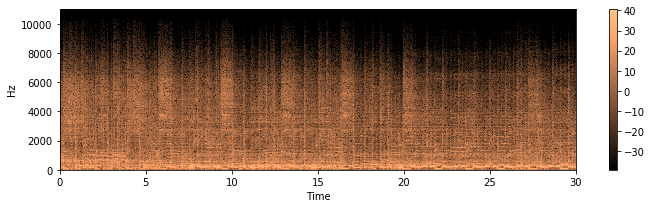

                                   Pop Genre                                    


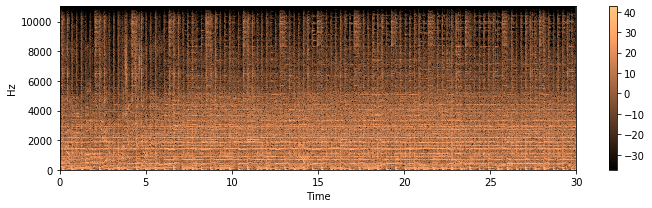

                                   Rock Genre                                   


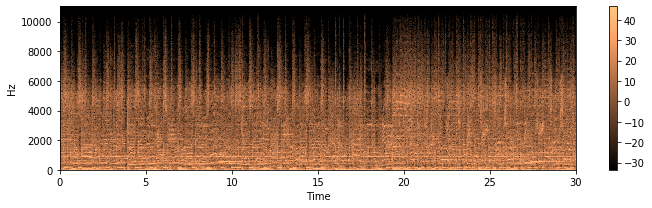

In [6]:
source = 'new/'
cmap = plt.get_cmap('copper')
for filename in os.listdir(f'{source}'):
    audioname = f'{source}/{filename}'
    spectogram, sr1 = librosa.load(audioname)
    filename = filename[:-3].replace("."," Genre")
    new_string = filename.center(80)
    print('\033[1m' + new_string)
    X = librosa.stft(spectogram)
    db = librosa.amplitude_to_db(abs(X))
    plt.figure(figsize=(10, 3))
    librosa.display.specshow(db, sr=sr1, x_axis='time', y_axis='hz', cmap=cmap)
    plt.colorbar()
    plt.tight_layout()
    plt.show()
    

### Converting all Audio files to Spectogram
According to the genre type the spectogram are segregated and store into repsective directorie, so the metadata is imported for extraction of spectogram

In [2]:
import pandas as pd

data = pd.read_csv('new.csv')
data.head()

,track_id,parent_genre_id,parent_genre_title
0,2,21,Hip-Hop
1,5,21,Hip-Hop
2,10,10,Pop
3,140,17,Folk
4,141,17,Folk


In [3]:
track=data.iloc[0:7999:,0].to_list()
name=data.iloc[0:7999:,2].to_list()

In [4]:
hip_hop = []
Pop = []
Folk = []
Experimental = []
Instrumental = []
International = []
Rock = []
Electronic =[]
for index, row in data.iterrows():
    #print(row['parent_genre_title'], row['track_id'])
    if row['parent_genre_title'] == 'Hip-Hop':
        hip_hop.append(row['track_id'])
    elif row['parent_genre_title'] == 'Pop':
        Pop.append(row['track_id'])
    elif row['parent_genre_title'] == 'Folk':
        Folk.append(row['track_id'])
    elif row['parent_genre_title'] == 'Experimental':
        Experimental.append(row['track_id'])
    elif row['parent_genre_title'] == 'Instrumental':
        Instrumental.append(row['track_id'])
    elif row['parent_genre_title'] == 'International':
        International.append(row['track_id'])
    elif row['parent_genre_title']== 'Rock':
        Rock.append(row['track_id'])
    else:
        Electronic.append(row['track_id'])

In [5]:
my_dict = {
    'Hip-Hop': hip_hop,
    'Pop': Pop,
    'Folk':Folk,
    'Experimental':Experimental,
    'Instrumental':Instrumental,
    'International':International,
    'Rock':Rock,
    'Electronic':Electronic
}

In [ ]:
import librosa
import matplotlib.pyplot as plt
cmap = plt.get_cmap('copper')
for key in my_dict:
    if not os.path.exists('Spectogram/{}'.format(key)):
        os.makedirs('Spectogram/{}'.format(key))
    for i in my_dict[key]:
        if i < 10:
            x ='00000'+str(i)
            stri = x+'.wav'
            y, sr = librosa.load('fma_small_wav/'+'/'+ stri)
            S = librosa.feature.melSpectogram(y, sr=sr, n_mels=128)
            log_S = librosa.core.power_to_db(S, ref=np.max)
            fig = plt.figure(figsize=(12, 4))
            ax = plt.Axes(fig, [0., 0., 1., 1.])
            ax.set_axis_off()
            fig.add_axes(ax)
            librosa.display.specshow(log_S, sr=sr, x_axis='time', y_axis='mel',cmap=cmap)
            plt.savefig('Spectogram/{}/{}.png'.format(key,x))
            image = Image.open('Spectogram/{}/{}.png'.format(key,x)).convert("RGB")
            image.save('Spectogram/{}/{}.png'.format(key,x))
            plt.close()
        elif i < 100 and i > 9:
            x ='0000'+str(i)
            stri = x+'.wav'
            y, sr = librosa.load('fma_small_wav/'+'/'+ stri)
            S = librosa.feature.melSpectogram(y, sr=sr, n_mels=128)
            log_S = librosa.core.power_to_db(S, ref=np.max)
            fig = plt.figure(figsize=(12, 4))
            ax = plt.Axes(fig, [0., 0., 1., 1.])
            ax.set_axis_off()
            fig.add_axes(ax)
            librosa.display.specshow(log_S, sr=sr, x_axis='time', y_axis='mel',cmap=cmap)
            plt.savefig('Spectogram/{}/{}.png'.format(key,x))
            image = Image.open('Spectogram/{}/{}.png'.format(key,x)).convert("RGB")
            image.save('Spectogram/{}/{}.png'.format(key,x))
            plt.close()
        elif i < 1000 and i >99:
            x ='000'+str(i)
            stri = x+'.wav'
            y, sr = librosa.load('fma_small_wav/'+'/'+ stri)
            S = librosa.feature.melSpectogram(y, sr=sr, n_mels=128)
            log_S = librosa.core.power_to_db(S, ref=np.max)
            fig = plt.figure(figsize=(12, 4))
            ax = plt.Axes(fig, [0., 0., 1., 1.])
            ax.set_axis_off()
            fig.add_axes(ax)
            librosa.display.specshow(log_S, sr=sr, x_axis='time', y_axis='mel',cmap=cmap)
            plt.savefig('Spectogram/{}/{}.png'.format(key,x))
            image = Image.open('Spectogram/{}/{}.png'.format(key,x)).convert("RGB")
            image.save('Spectogram/{}/{}.png'.format(key,x))
            plt.close()
        elif i < 10000 and i > 999:
            x ='00'+str(i)
            y, sr = librosa.load('fma_small_wav/'+'/'+ stri)
            S = librosa.feature.melSpectogram(y, sr=sr, n_mels=128)
            log_S = librosa.core.power_to_db(S, ref=np.max)
            fig = plt.figure(figsize=(12, 4))
            ax = plt.Axes(fig, [0., 0., 1., 1.])
            ax.set_axis_off()
            fig.add_axes(ax)
            librosa.display.specshow(log_S, sr=sr, x_axis='time', y_axis='mel',cmap=cmap)
            plt.savefig('Spectogram/{}/{}.png'.format(key,x))
            image = Image.open('Spectogram/{}/{}.png'.format(key,x)).convert("RGB")
            image.save('Spectogram/{}/{}.png'.format(key,x))
            plt.close()
        elif i < 100000 and i >9999:
            x ='0'+str(i)
            stri = x+'.wav'
            y, sr = librosa.load('fma_small_wav/'+'/'+ stri)
            S = librosa.feature.melSpectogram(y, sr=sr, n_mels=128)
            log_S = librosa.core.power_to_db(S, ref=np.max)
            fig = plt.figure(figsize=(12, 4))
            ax = plt.Axes(fig, [0., 0., 1., 1.])
            ax.set_axis_off()
            fig.add_axes(ax)
            librosa.display.specshow(log_S, sr=sr, x_axis='time', y_axis='mel',cmap=cmap)
            plt.savefig('Spectogram/{}/{}.png'.format(key,x))
            image = Image.open('Spectogram/{}/{}.png'.format(key,x)).convert("RGB")
            image.save('Spectogram/{}/{}.png'.format(key,x))
            plt.close()
        elif i <1000000 and i > 99999:
            x =str(i)
            stri = x+'.wav'
            y, sr = librosa.load('fma_small_wav/'+'/'+ stri)
            S = librosa.feature.melSpectogram(y, sr=sr, n_mels=128)
            log_S = librosa.core.power_to_db(S, ref=np.max)
            fig = plt.figure(figsize=(12, 4))
            ax = plt.Axes(fig, [0., 0., 1., 1.])
            ax.set_axis_off()
            fig.add_axes(ax)
            librosa.display.specshow(log_S, sr=sr, x_axis='time', y_axis='mel',cmap=cmap)
            plt.savefig('Spectogram/{}/{}.png'.format(key,x))
            image = Image.open('Spectogram/{}/{}.png'.format(key,x)).convert("RGB")
            image.save('Spectogram/{}/{}.png'.format(key,x))
            plt.close()

### After extraction and Evaluation of the  preocessed data, the data is used for transfer learning (Inception V3) and CNN deep learning model.